# Importing libaries

In [1]:
import glob
import os 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family']="Avenir"
import seaborn as sns
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objs as go
pyo.init_notebook_mode()
from wordcloud import WordCloud, STOPWORDS
from functools import reduce
from PIL import Image
from collections import Counter

import plotly.figure_factory as ff
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

# Defining functions to be used in this notebook

In [2]:
def convert_to_mins(string):
    if isinstance(string, float):
        return None
    a=string.split(' ')
    
    if len(a)==4:
        duration_in_min = int(a[0])*60 + int(a[2])
        
    elif (len(a)==2) and (a[1]=='m'):
        duration_in_min = int(a[0])
        
    elif (len(a)==2) and (a[1]=='h'):
        duration_in_min = int(a[0])*60
        
    elif (len(a)==1) and (a[0]=='Multi-day') :
        duration_in_min = 1500
        
    else:
        duration_in_min = None
        
    return duration_in_min

In [3]:
def convert_to_miles(string):
    if isinstance(string, float):
        return None
    
    a=string.split(' ')
    if (len(a)==2) and (a[1]=='mi'):
        distance = float(a[0])
    else:
        distance = None
    return distance

In [4]:
def number_of_tags(lst):
    return len(lst.split(','))

In [5]:
def number_of_words(string):
    return (len(string))

In [6]:
def difficulty(string):
    if string =='easy':
        return 1
    elif string == 'moderate':
        return 2
    elif string=='hard':
        return 3
    else:
        return -1

In [7]:
def is_there(string):
    if NaN:
        return 0
    else:
        return 1

In [8]:
def code_generator(name):
    return us_state_abbrev[name.replace('-', ' ').title()]

In [9]:
def gen_tag_list(string):
    return eval(string)

In [10]:
us_state_abbrev = {
'Alabama': 'AL',
'Alaska': 'AK',
'American Samoa': 'AS',
'Arizona': 'AZ',
'Arkansas': 'AR',
'California': 'CA',
'Colorado': 'CO',
'Connecticut': 'CT',
'Delaware': 'DE',
'District of Columbia': 'DC',
'Florida': 'FL',
'Georgia': 'GA',
'Guam': 'GU',
'Hawaii': 'HI',
'Idaho': 'ID',
'Illinois': 'IL',
'Indiana': 'IN',
'Iowa': 'IA',
'Kansas': 'KS',
'Kentucky': 'KY',
'Louisiana': 'LA',
'Maine': 'ME',
'Maryland': 'MD',
'Massachusetts': 'MA',
'Michigan': 'MI',
'Minnesota': 'MN',
'Mississippi': 'MS',
'Missouri': 'MO',
'Montana': 'MT',
'Nebraska': 'NE',
'Nevada': 'NV',
'New Hampshire': 'NH',
'New Jersey': 'NJ',
'New Mexico': 'NM',
'New York': 'NY',
'North Carolina': 'NC',
'North Dakota': 'ND',
'Northern Mariana Islands':'MP',
'Ohio': 'OH',
'Oklahoma': 'OK',
'Oregon': 'OR',
'Pennsylvania': 'PA',
'Puerto Rico': 'PR',
'Rhode Island': 'RI',
'South Carolina': 'SC',
'South Dakota': 'SD',
'Tennessee': 'TN',
'Texas': 'TX',
'Utah': 'UT',
'Vermont': 'VT',
'Virgin Islands': 'VI',
'Virginia': 'VA',
'Washington': 'WA',
'West Virginia': 'WV',
'Wisconsin': 'WI',
'Wyoming': 'WY'
}

# Merging two csv files fore each state

Trail information for each state is saved in 2 csv files. We will first combine the 2 csv files:

In [11]:
path1 ='/Users/eunheelim/Capstone1/data4/*.csv'
path2 = '/Users/eunheelim/Capstone1/data5/*.csv'

filelist1=sorted(glob.iglob(path1))
filelist2=sorted(glob.iglob(path2))

df = pd.DataFrame() 

for file in filelist1:
    state = file[33:-4]
    file2 =  '/Users/eunheelim/Capstone1/data5/' + state + '2.csv'
    
    df1 = pd.read_csv(file,
                  header=None,
                  names=['duration', 'distance'])

    df2 = df2 = pd.read_csv(file2,
                 index_col='Unnamed: 0')
    
    df0= df2.join(df1)
    df0['state'] = state
    
    df= df.append(df0)

# Data engineering on the data frame

In [12]:
df['difficulty_rating'] = df['difficulty'].apply(difficulty)
df['short'] = df['short_description'].apply(number_of_words)
df['long'] = np.where(df['long_description'].isna(), 0, 1)
df['n_tags'] = df['tag_list'].apply(number_of_tags)

df['distance_mi']= df['distance'].apply(convert_to_miles)
df['duration_min']= df['duration'].apply(convert_to_mins)
df["State"] = df['state'].apply(code_generator)

df= df.drop(columns={'distance', 'duration','best_rating','worst_rating','difficulty'})

# Changing column names
df= df.rename(columns={"average_rating": "stars", "difficulty_rating":"difficulty", "distance_mi":'distance',"duration_min":"duration"})

df = df[df['duration']<1500]
df = df[df['review_count']!=0]

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35265 entries, 0 to 825
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               35265 non-null  object 
 1   stars              35265 non-null  float64
 2   review_count       35265 non-null  int64  
 3   location           35265 non-null  object 
 4   elevation          35265 non-null  float64
 5   route_type         35265 non-null  object 
 6   short_description  35265 non-null  object 
 7   long_description   17056 non-null  object 
 8   tag_list           35265 non-null  object 
 9   n_photos           35265 non-null  int64  
 10  n_recordings       35265 non-null  int64  
 11  n_completed        35265 non-null  int64  
 12  state              35265 non-null  object 
 13  difficulty         35265 non-null  int64  
 14  short              35265 non-null  int64  
 15  long               35265 non-null  int64  
 16  n_tags             35265

## Histogram of features

array([[<AxesSubplot:title={'center':'stars'}>,
        <AxesSubplot:title={'center':'review_count'}>,
        <AxesSubplot:title={'center':'elevation'}>],
       [<AxesSubplot:title={'center':'n_photos'}>,
        <AxesSubplot:title={'center':'n_recordings'}>,
        <AxesSubplot:title={'center':'n_completed'}>],
       [<AxesSubplot:title={'center':'difficulty'}>,
        <AxesSubplot:title={'center':'short'}>,
        <AxesSubplot:title={'center':'long'}>],
       [<AxesSubplot:title={'center':'n_tags'}>,
        <AxesSubplot:title={'center':'distance'}>,
        <AxesSubplot:title={'center':'duration'}>]], dtype=object)

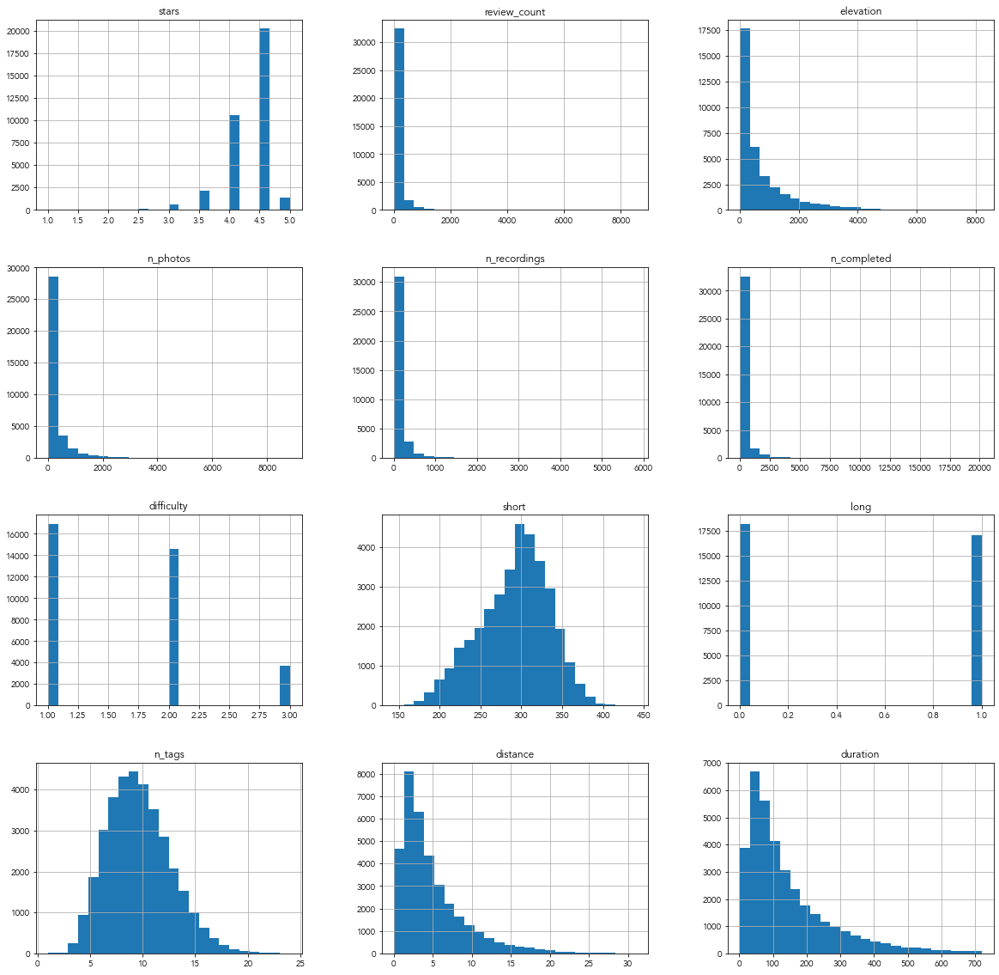

In [14]:
df.hist(bins=24, figsize=(20,20))

- Star rating is slightly left skewed and the mode is 4.5. 
- Review count, elevation, n_photos, n_recordings, and n_completed show exponential distirbution with a few observations at high number. 
- There are similar amount of observations with easy and medium difficulty, and about 1/3~1/4 number of observations with high difficulty.
- Number of words in short description has normal distritubtion around ~300 words
- About half of observations have long description, and half does not.
- Number of tages (n_tags) also has normal distribution with center around 10 tags.

## Pairplot

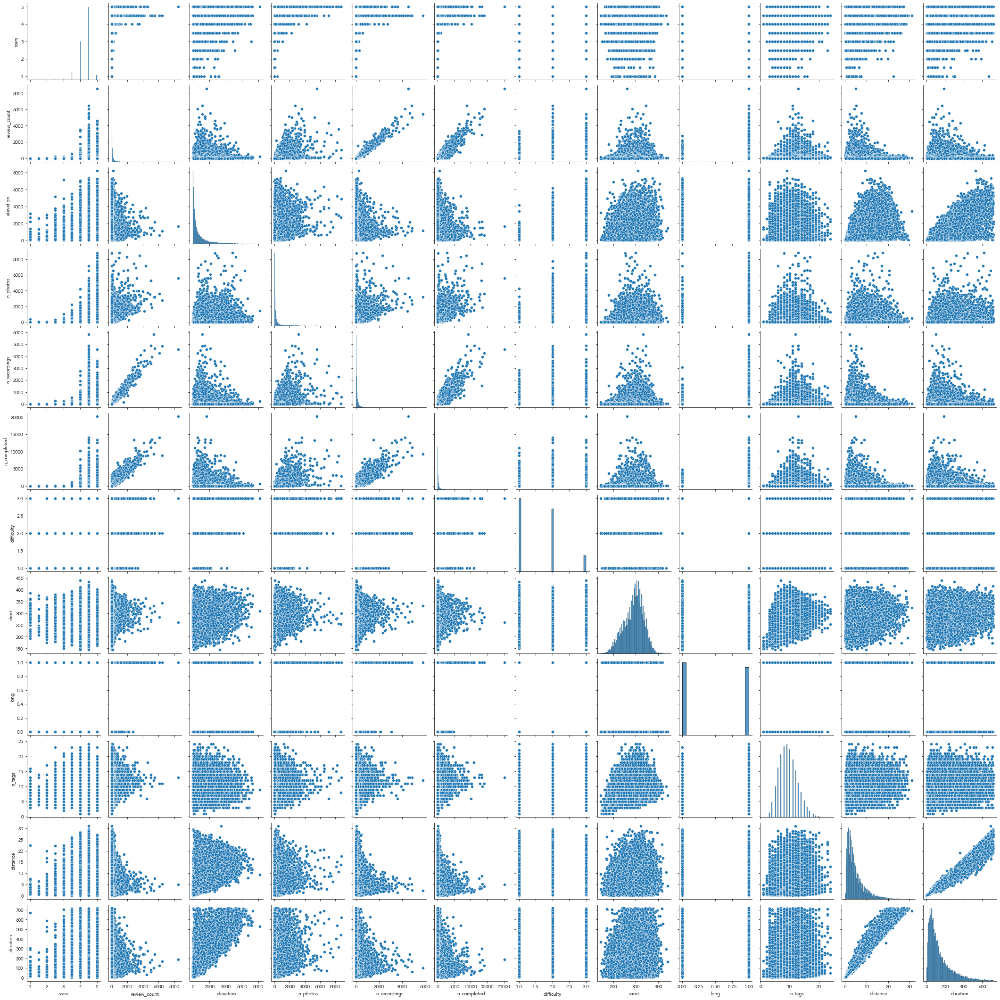

In [15]:
sns.pairplot(df)

# Visualizing star rating distribution

In [16]:
# Calculate % of each star rating for the entire dataset
a = df['stars'].value_counts().sort_index(ascending=False)
b= np.around(a/len(df['stars'])*100,2)
print(f'Star rating distribution [%]:\n{b}')

Star rating distribution [%]:
5.0     3.96
4.5    57.36
4.0    30.10
3.5     6.03
3.0     1.69
2.5     0.51
2.0     0.19
1.5     0.05
1.0     0.10
Name: stars, dtype: float64


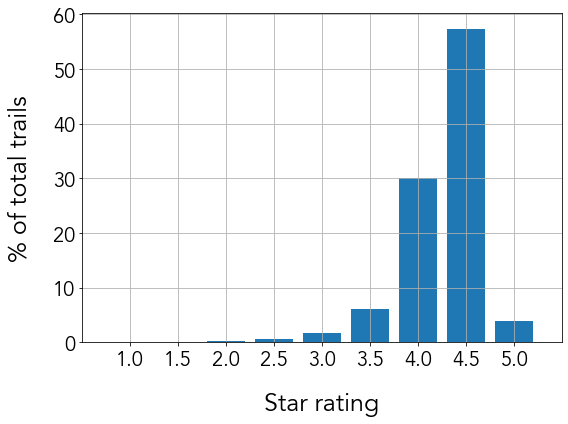

In [17]:
# Make a bar plot of star rating distribution for the entire dataset
arr = (df['stars'].to_numpy())
labels, counts = np.unique(arr, return_counts=True)
counts = counts/len(arr)*100

fig, ax = plt.subplots(figsize=(8, 6))

ax.set_ylabel('% of total trails', fontsize=25)
ax.set_xlabel('Star rating', fontsize=25)
ax.grid('off')
ax.set_xlim(0.5,5.5)
ax.tick_params(labelsize=20)
ax.yaxis.labelpad = 20
ax.xaxis.labelpad = 20
ax.bar(labels, counts, width=0.4, align='center')
plt.gca().set_xticks(labels)
plt.tight_layout()
plt.savefig('../images/star_rating_histogram.png')
plt.show()

In [18]:
easy = df[df['difficulty']==1]
moderate = df[df['difficulty']==2]
hard = df[df['difficulty']==3]

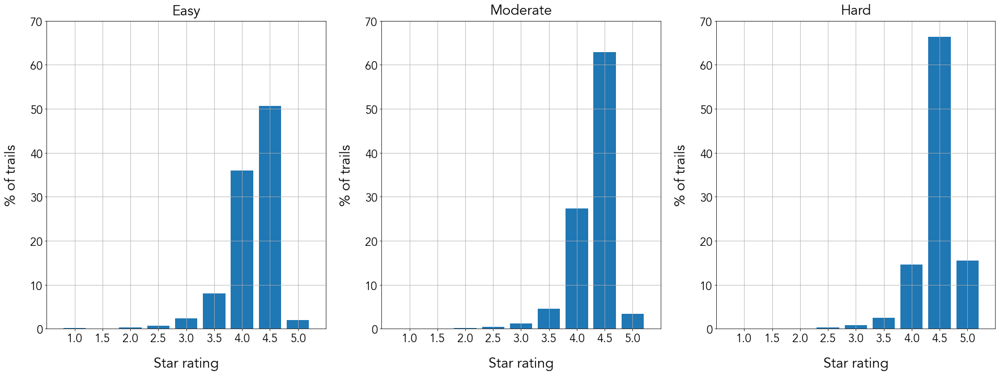

In [19]:
# Make a bar plot of star rating distribution for the entire dataset
fix, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(30,10), sharex='all')


arr1 = (easy['stars'].to_numpy())
labels1, counts1 = np.unique(arr1, return_counts=True)
counts1 = counts1/len(arr1)*100

arr2 = (moderate['stars'].to_numpy())
labels2, counts2 = np.unique(arr2, return_counts=True)
counts2 = counts2/len(arr2)*100

arr3 = (hard['stars'].to_numpy())
labels3, counts3 = np.unique(arr3, return_counts=True)
counts3 = counts3/len(arr3)*100

ax1.bar(labels1, counts1, width=0.4, align='center')
ax2.bar(labels2, counts2, width=0.4, align='center')
ax3.bar(labels3, counts3, width=0.4, align='center')

ax1.set_ylabel('% of trails', fontsize=25)
ax1.set_xlabel('Star rating', fontsize=25)
ax1.grid('off')
ax1.set_xlim(0.5,5.5)
ax1.set_ylim(0,70)
ax1.tick_params(labelsize=20)
ax1.yaxis.labelpad = 20
ax1.xaxis.labelpad = 20
ax1.set_title('Easy', fontsize=25, y=1.01)

ax2.set_ylabel('% of trails', fontsize=25)
ax2.set_xlabel('Star rating', fontsize=25)
ax2.grid('off')
ax2.set_xlim(0.5,5.5)
ax2.set_ylim(0,70)
ax2.tick_params(labelsize=20)
ax2.yaxis.labelpad = 20
ax2.xaxis.labelpad = 20
ax2.set_title('Moderate', fontsize=25, y=1.01)

ax3.set_ylabel('% of trails', fontsize=25)
ax3.set_xlabel('Star rating', fontsize=25)
ax3.grid('off')
ax3.set_xlim(0.5,5.5)
ax3.set_ylim(0,70)
ax3.tick_params(labelsize=20)
ax3.yaxis.labelpad = 20
ax3.xaxis.labelpad = 20
ax3.set_title('Hard', fontsize=25, y=1.01)

plt.gca().set_xticks(labels)
plt.tight_layout

plt.savefig('../images/star_rating_histogram_by_difficulty.png')
plt.show()



In [20]:
easy['stars'].mean()

4.1874261054622846

In [21]:
moderate['stars'].mean()

4.302177485620378

In [22]:
hard['stars'].mean()

4.458878504672898

## Visualizing data by states (geographic):

In [23]:
import plotly.io as pio; pio.renderers.default='notebook'

In [24]:
state_stars= df.groupby('State').mean()['stars'].reset_index()
fig = px.choropleth(state_stars, locations='State',locationmode="USA-states",title='Average Star Rating for Trails by State', color='stars', scope="usa", color_continuous_scale=px.colors.sequential.YlGn)
fig.update_layout(title_text='Average Trail Star Rating by State', title_x=0.5, title_y=0.82)
fig.write_image('../images/map_star.png', scale=3)
fig.show()

In [25]:
state_difficulty= df.groupby('State').mean()['difficulty'].reset_index()
fig = px.choropleth(state_difficulty, locations='State',locationmode="USA-states",title='Average difficulty for Trails by State', 
                    color='difficulty', scope="usa", color_continuous_scale=px.colors.sequential.Brwnyl)
fig.update_layout(title_text='Average difficulty for Trails by State', title_x=0.5, title_y=0.82)
fig.write_image('../images/map_difficulty.png', scale=3)
fig.show()

### Number of trails with less than 4 star rating by state

In [26]:
state_low_star= (df[df['stars']<4].groupby('State').size()).reset_index()
state_low_star.columns = ['State','count']
state_low_star.sort_values('count')

,State,count
3,AZ,1
4,CA,1
25,NC,4
32,NY,4
45,WA,5
26,ND,7
42,UT,11
17,MA,14
27,NE,16
35,OR,17


## Lowest rated trail in California

In [27]:
df[df['State']=='CA'].min()

name                                          Deer Creek Tribute Trail
stars                                                              3.5
review_count                                                        74
location                                   Abalone Cove Shoreline Park
elevation                                                            6
route_type                                                        Loop
short_description     Deer Creek Tribute Trail is a 7.8 mile modera...
tag_list             ['Backpacking', 'Camping', 'Fishing', 'Hiking'...
n_photos                                                            36
n_recordings                                                        44
n_completed                                                        178
state                                                       california
difficulty                                                           1
short                                                              191
long  

### Number of trails in each State

In [28]:
grouped = df.groupby('State').size().reset_index()
grouped.columns = ['State','count']
sorted_grouped = grouped.sort_values('count', ascending=False)

Text(0.5, 1.01, 'Number of trails in each state')

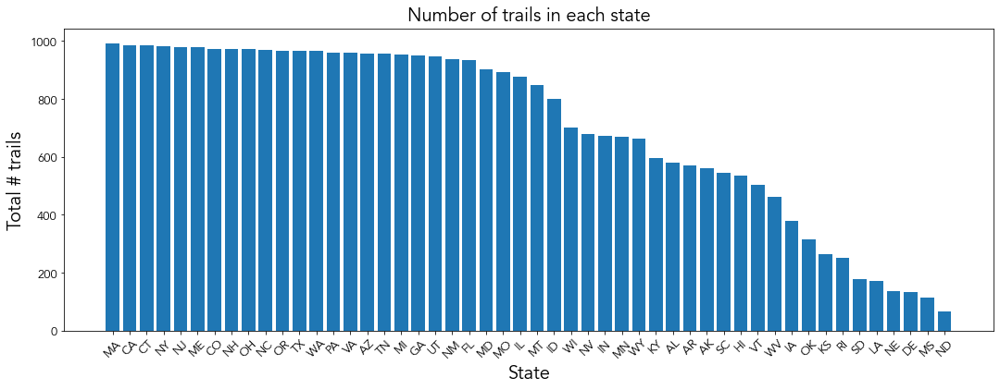

In [29]:
fig=plt.figure(figsize=(18,6))
ax=fig.add_subplot(111)
ax.bar(sorted_grouped['State'], sorted_grouped['count'])

ax.set_ylabel('Total # trails',fontsize=20)
ax.set_xlabel('State', fontsize=20)
plt.xticks(rotation=45)
ax.tick_params(labelsize=13)
ax.set_title('Number of trails in each state',y=1.01,fontsize=20)

### Percentage of trails with less than 4 star rating in each state

In [30]:
result = pd.merge(state_low_star, grouped, on='State', how='inner', suffixes=('_low_star', '_total'))

In [31]:
result['% low'] = result['count_low_star']/result['count_total']*100

In [32]:
sorted_result = result.sort_values('% low', ascending=False)

Text(0.5, 1.01, 'Percentage of trails with less than 4 star rating in each state')

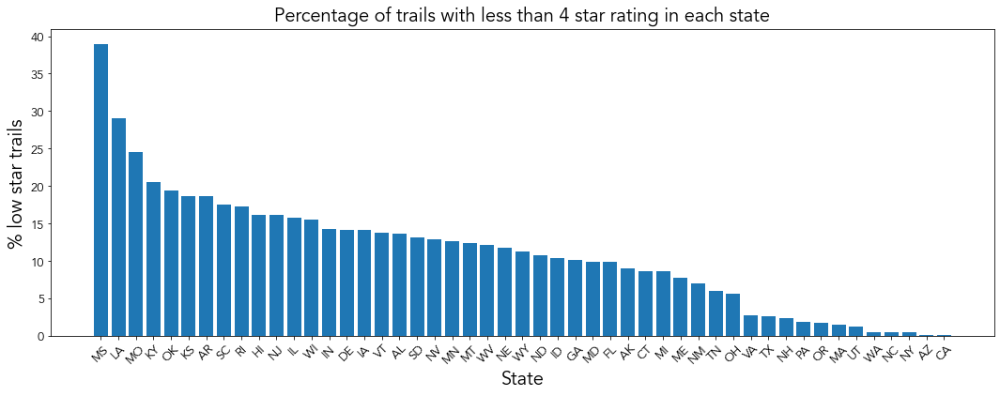

In [33]:
fig=plt.figure(figsize=(18,6))
ax=fig.add_subplot(111)
ax.bar(sorted_result['State'], sorted_result['% low'])

ax.set_ylabel('% low star trails',fontsize=20)
ax.set_xlabel('State', fontsize=20)
plt.xticks(rotation=45)
ax.tick_params(labelsize=13)
ax.set_title('Percentage of trails with less than 4 star rating in each state',y=1.01,fontsize=20)

In [34]:
fig = px.choropleth(result, locations='State',locationmode="USA-states",title='Percentage of Trails with Star rating 3.5 or less', 
                    color='% low', scope="usa", color_continuous_scale=px.colors.sequential.Blues)

fig.update_layout(title_text='% of trails with star rating 3.5 and less', title_x=0.5, title_y=0.82)
fig.write_image('../images/map_low_star.png', scale=3)
fig.show()

## Most frequently used words

In [35]:
# Convert contents of tag_list column (str) to actual list
df['tag_list'] = df['tag_list'].apply(gen_tag_list)

In [36]:
# Get list of top 5 and bottom 5 states in terms of average star rating
bottom5 = df.groupby('state').mean('stars').sort_values('stars').head(5)
top5 = df.groupby('state').mean('stars').sort_values('stars').tail(5)

In [37]:
print ("Bottom 5: " , bottom5.index)
print ("top 5: " , top5.index)

Bottom 5:  Index(['mississippi', 'louisiana', 'missouri', 'kentucky', 'oklahoma'], dtype='object', name='state')
top 5:  Index(['utah', 'new-york', 'arizona', 'colorado', 'california'], dtype='object', name='state')


In [38]:
top = df[df['state'].isin(['california', 'arizona', 'colorado', 'utah', 'new-hampshire'])]
bottom = df[df['state'].isin(['mississippi', 'louisiana', 'oklahoma', 'kansas', 'rhode-island'])]

In [39]:
from wordcloud import WordCloud, STOPWORDS

['Hiking', 'Views', 'Nature trips', 'Wildlife', 'Wild flowers', 'Forest', 'Bird watching', 'Walking', 'Running', 'Dogs on leash']


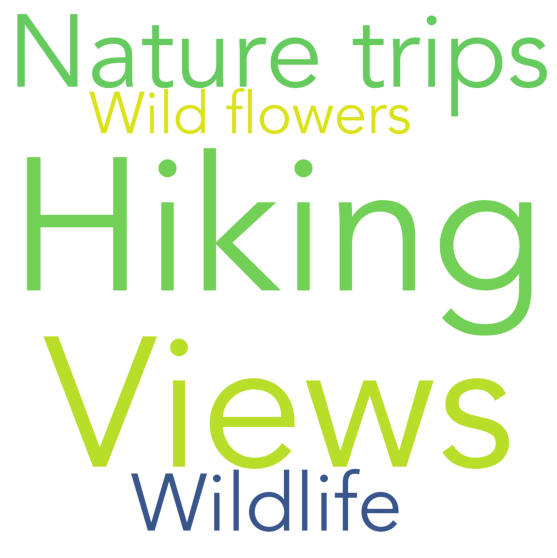

In [40]:
top['State'].value_counts()
bottom['State'].value_counts()
# top 5 word cloud
word_list_top = reduce(lambda a, b: a + b, top['tag_list'].tolist())

word_list_top = Counter(word_list_top)

import operator
sorted_top = dict( sorted(word_list_top.items(), key=operator.itemgetter(1),reverse=True))
print(list(sorted_top)[:10])


wordcloud_top = WordCloud(width=2000, height = 2000, max_words=5,  random_state=1, font_path='Avenir',
                      background_color='white',  collocations = True, 
                    stopwords=STOPWORDS).generate_from_frequencies(word_list_top) 

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(111)
ax1.imshow(wordcloud_top)
ax1.axis("off")
#plt.savefig("CA_Wordcloud.png", dpi=300, bbox_inches='tight')
plt.show()

Text(0.5, 1.01, 'Top tag words from 5 states \nwith highest average star rating')

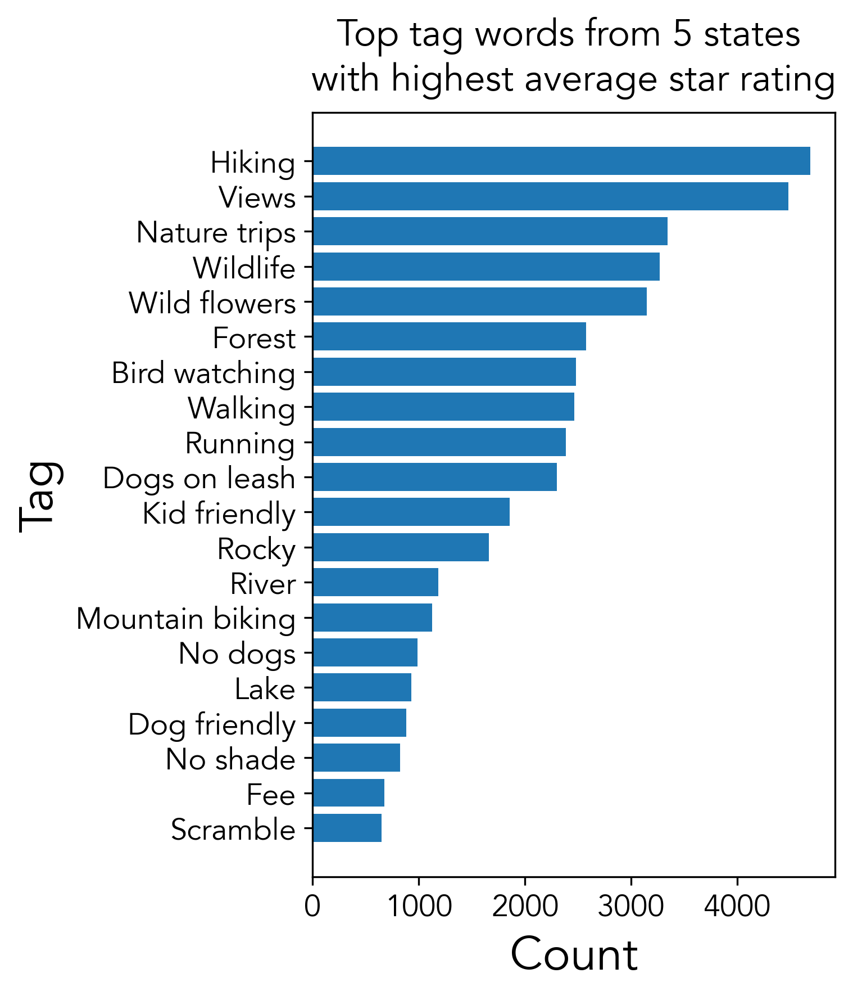

In [41]:
fig=plt.figure(figsize=(4,6), dpi=300)
ax=fig.add_subplot(111)
ax.invert_yaxis()
ax.barh(list(sorted_top.keys())[:20], list(sorted_top.values())[:20])

ax.set_xlabel('Count',fontsize=20)
ax.set_ylabel('Tag', fontsize=20)
ax.tick_params(labelsize=13)
ax.set_title('Top tag words from 5 states \nwith highest average star rating',y=1.01,fontsize=16)
#plt.savefig('../images/top_tags.png', bbox_inches="tight")

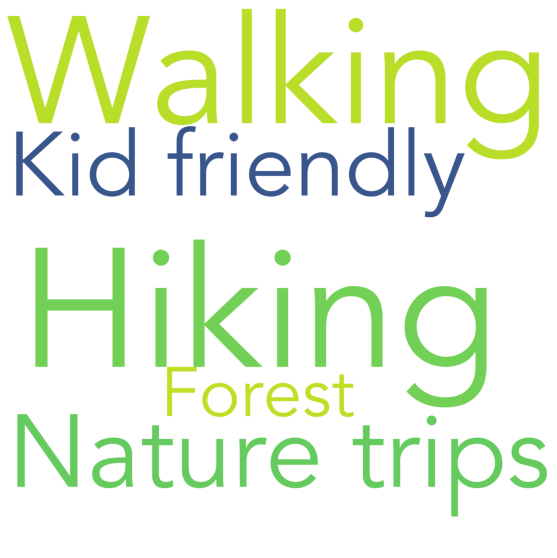

In [42]:
# bottom 5 word cloud
word_list_bottom = reduce(lambda a, b: a + b, bottom['tag_list'].tolist())
word_list_bottom = Counter(word_list_bottom)

sorted_bottom = dict( sorted(word_list_bottom.items(), key=operator.itemgetter(1),reverse=True))
#print(list(sorted_bottom)[1:10])

wordcloud_bottom = WordCloud(width=2000, height = 2000,max_words=5,  random_state=1, font_path='Avenir',
                      background_color='white',  collocations = True, 
                    stopwords=STOPWORDS).generate_from_frequencies(sorted_bottom) 

fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(111)
ax1.imshow(wordcloud_bottom)
ax1.axis("off")
#plt.savefig("CA_Wordcloud.png", dpi=300, bbox_inches='tight')
plt.show()

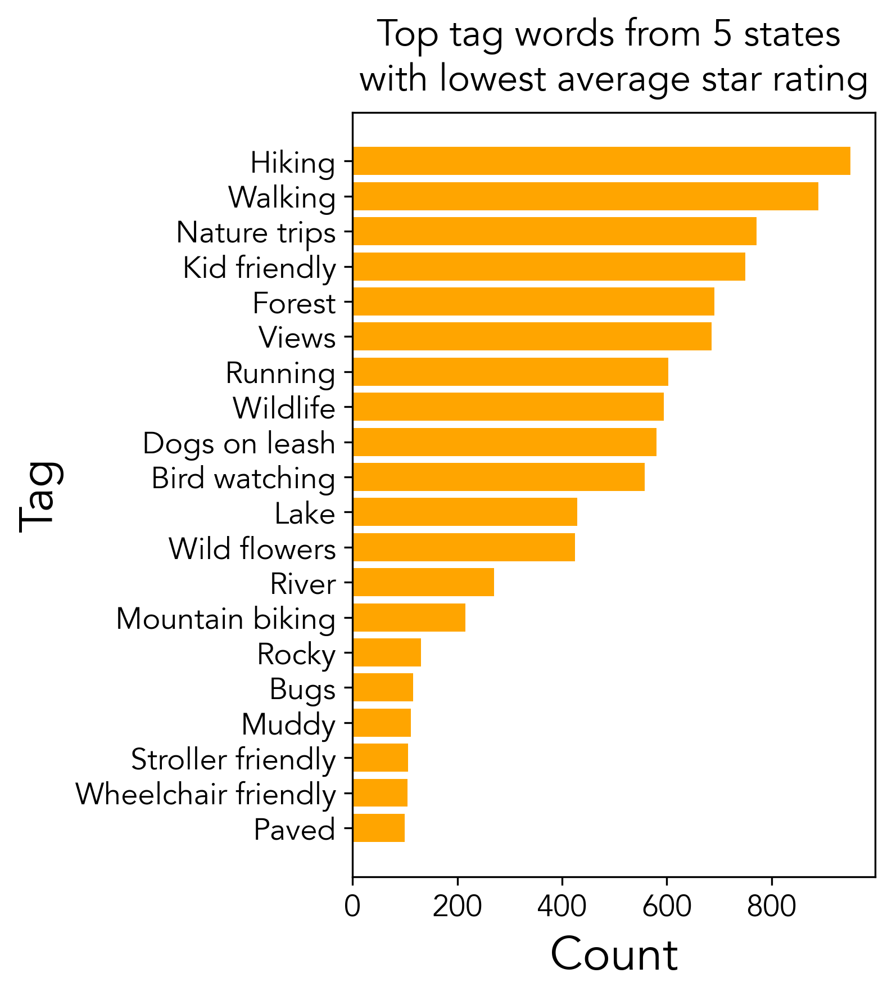

In [43]:
fig=plt.figure(figsize=(4,6), dpi=300)
ax=fig.add_subplot(111)
ax.barh(list(sorted_bottom.keys())[:20], list(sorted_bottom.values())[:20],color='orange')
ax.invert_yaxis()
ax.set_xlabel('Count',fontsize=20)
ax.set_ylabel('Tag', fontsize=20)
ax.tick_params(labelsize=13)
ax.set_title('Top tag words from 5 states \nwith lowest average star rating',y=1.01,fontsize=16)
plt.savefig('../images/bottom_tags.png', bbox_inches="tight")

# Hypothesis testing

In [44]:
from scipy import stats

In [45]:
easy = df[df['difficulty']==1]['stars']
moderate = df[df['difficulty']==2]['stars']
hard = df[df['difficulty']==3]['stars']

In [46]:
t1,p1 = stats.ttest_ind(easy, moderate, equal_var=False)
t2,p2 = stats.ttest_ind(moderate, hard, equal_var=False)
t3,p3 = stats.ttest_ind(easy, hard, equal_var=False)


print("ttest_ind_1:            t = %g  p = %g" % (t1, p1))
print("ttest_ind_2:            t = %g  p = %g" % (t2, p2))
print("ttest_ind_3:            t = %g  p = %g" % (t3, p3))

ttest_ind_1:            t = -24.7294  p = 9.74345e-134
ttest_ind_2:            t = -22.943  p = 1.10771e-111
ttest_ind_3:            t = -39.0609  p = 2.99601e-299


In [47]:
F,p = stats.kruskal(easy, moderate, hard)

In [48]:
F,p

(1821.6043033865217, 0.0)

In [49]:
from scipy.stats import f_oneway

In [50]:
t1,p1 = stats.ttest_ind(easy, moderate, equal_var=False)
t2,p2 = stats.ttest_ind(easy, hard, equal_var=False)
t3,p3 = stats.ttest_ind(moderate, hard, equal_var=False)


print("ttest_ind_1:            t = %g  p = %g" % (t1, p1))
print("ttest_ind_2:            t = %g  p = %g" % (t2, p2))
print("ttest_ind_3:            t = %g  p = %g" % (t3, p3))

ttest_ind_1:            t = -24.7294  p = 9.74345e-134
ttest_ind_2:            t = -39.0609  p = 2.99601e-299
ttest_ind_3:            t = -22.943  p = 1.10771e-111


In [51]:
f_oneway(easy, moderate, hard)

F_onewayResult(statistic=778.2716337254296, pvalue=0.0)

In [52]:
loop = df[df['route_type']=='Loop']['stars']
outback = df[df['route_type']=='Out & Back']['stars']
ptop = df[df['route_type']=='Point to Point']['stars']

In [53]:
t1,p1 = stats.ttest_ind(loop, outback, equal_var=False)
t2,p2 = stats.ttest_ind(loop, ptop, equal_var=False)
t3,p3 = stats.ttest_ind(outback, ptop, equal_var=False)


print("ttest_ind_1:            t = %g  p = %g" % (t1, p1))
print("ttest_ind_2:            t = %g  p = %g" % (t2, p2))
print("ttest_ind_3:            t = %g  p = %g" % (t3, p3))

ttest_ind_1:            t = -13.6577  p = 2.43139e-42
ttest_ind_2:            t = -9.20673  p = 1.02795e-19
ttest_ind_3:            t = -3.40505  p = 0.000676945


In [54]:
len(loop), len(outback), len(ptop)

(19714, 14180, 1371)

In [55]:
np.mean(loop), np.mean(outback), np.mean(ptop)

(4.234351222481485, 4.2977080394922424, 4.335886214442013)

In [56]:
np.var(loop), np.var(outback), np.var(ptop)

(0.17179655839177937, 0.1815568061553948, 0.1546859214073326)

In [57]:
f_oneway(loop,outback,ptop)

F_onewayResult(statistic=115.73711015648504, pvalue=7.948221665306701e-51)

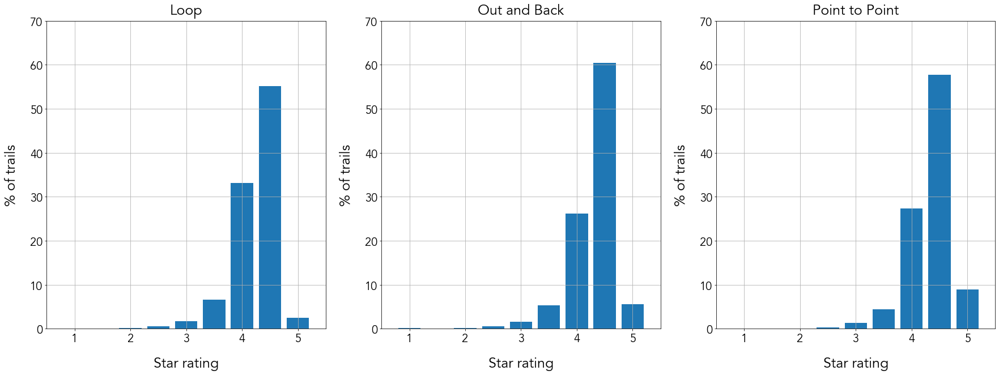

In [58]:
# Make a bar plot of star rating distribution for the entire dataset
fix, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(30,10), sharex='all')


arr1 = (loop.to_numpy())
labels1, counts1 = np.unique(arr1, return_counts=True)
counts1 = counts1/len(arr1)*100

arr2 = (outback.to_numpy())
labels2, counts2 = np.unique(arr2, return_counts=True)
counts2 = counts2/len(arr2)*100

arr3 = (ptop.to_numpy())
labels3, counts3 = np.unique(arr3, return_counts=True)
counts3 = counts3/len(arr3)*100

ax1.bar(labels1, counts1, width=0.4, align='center')
ax2.bar(labels2, counts2, width=0.4, align='center')
ax3.bar(labels3, counts3, width=0.4, align='center')

ax1.set_ylabel('% of trails', fontsize=25)
ax1.set_xlabel('Star rating', fontsize=25)
ax1.grid('off')
ax1.set_xlim(0.5,5.5)
ax1.set_ylim(0,70)
ax1.tick_params(labelsize=20)
ax1.yaxis.labelpad = 20
ax1.xaxis.labelpad = 20
ax1.set_title('Loop', fontsize=25, y=1.01)

ax2.set_ylabel('% of trails', fontsize=25)
ax2.set_xlabel('Star rating', fontsize=25)
ax2.grid('off')
ax2.set_xlim(0.5,5.5)
ax2.set_ylim(0,70)
ax2.tick_params(labelsize=20)
ax2.yaxis.labelpad = 20
ax2.xaxis.labelpad = 20
ax2.set_title('Out and Back', fontsize=25, y=1.01)

ax3.set_ylabel('% of trails', fontsize=25)
ax3.set_xlabel('Star rating', fontsize=25)
ax3.grid('off')
ax3.set_xlim(0.5,5.5)
ax3.set_ylim(0,70)
ax3.tick_params(labelsize=20)
ax3.yaxis.labelpad = 20
ax3.xaxis.labelpad = 20
ax3.set_title('Point to Point', fontsize=25, y=1.01)

#plt.gca().set_xticks(labels)
plt.tight_layout

plt.savefig('../images/star_rating_histogram_by_route_type.png')
plt.show()




### Star rating vs difficulty levels

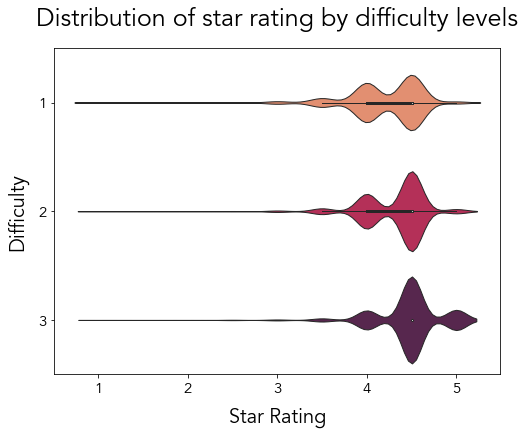

In [59]:
plt.figure(figsize=(8,6))
ax= sns.violinplot(y='difficulty',x='stars', data=df, 
                   bw=0.3, scale='area', palette='rocket_r', 
                   orient='h', linewidth=1)

#ax.set_title('Distribution of star rating for difficulty levels\n for trails with 3 or higher rating', fontsize=25)
ax.set_xlabel('Star Rating', fontsize=20)
ax.set_ylabel('Difficulty', fontsize=20)
ax.tick_params(labelsize=15)

ax.yaxis.labelpad = 10
ax.xaxis.labelpad = 10

plt.title('Distribution of star rating by difficulty levels', y=1.05, fontsize=25)

plt.show()

### Star rating vs route types

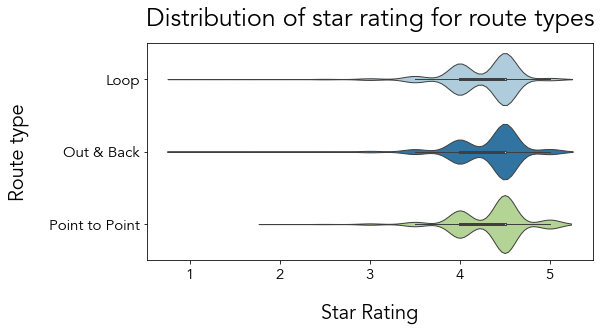

In [60]:
plt.figure(figsize=(8,4))
ax= sns.violinplot(y='route_type',x='stars', data=df, order = ['Loop', 'Out & Back', 'Point to Point'],
                   bw=0.3, scale='area', palette='Paired', 
                   orient='h', linewidth=1)

ax.set_xlabel('Star Rating', fontsize=20)
ax.set_ylabel('Route type', fontsize=20)
ax.tick_params(labelsize=15)
ax.yaxis.labelpad = 20
ax.xaxis.labelpad = 20
plt.title('Distribution of star rating for route types', y=1.05, fontsize=25)
plt.show()

### Star rating vs elevation levels

In [61]:
df['elevation'].describe()

count    35265.000000
mean       726.623026
std        957.919192
min          0.000000
25%        114.000000
50%        341.000000
75%        944.000000
max       8195.000000
Name: elevation, dtype: float64

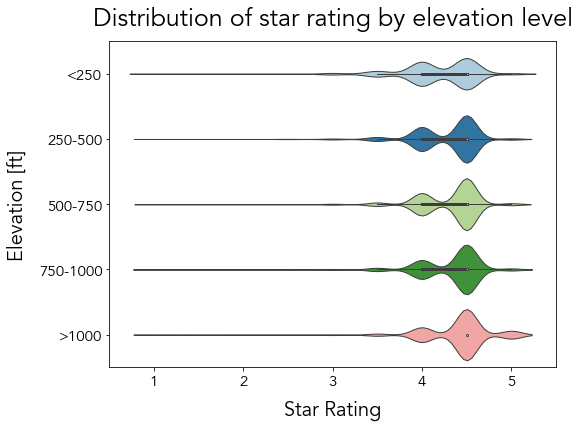

In [62]:
# create a list of our conditions
conditions = [
    (df['elevation'] <= 250),
    (df['elevation'] > 250) & (df['elevation'] <= 500),
    (df['elevation'] > 500) & (df['elevation'] <= 750),
    (df['elevation'] > 750) & (df['elevation'] <= 1000),
    (df['elevation'] > 1000)
    ]

# create a list of the values we want to assign for each condition
values = ['<250', '250-500', '500-750', '750-1000', '>1000']

# create a new column and use np.select to assign values to it using our lists as arguments
df['tier'] = np.select(conditions, values)

# display updated DataFrame
df.head()


plt.figure(figsize=(8,6))
ax= sns.violinplot(y='tier',x='stars', data=df, order = values,
                   bw=0.3, scale='area', palette='Paired', 
                   orient='h', linewidth=1)

#ax.set_title('Distribution of star rating for difficulty levels\n for trails with 3 or higher rating', fontsize=25)
ax.set_xlabel('Star Rating', fontsize=20)
ax.set_ylabel('Elevation [ft]', fontsize=20)
ax.tick_params(labelsize=15)
ax.yaxis.labelpad = 10
ax.xaxis.labelpad = 10

plt.title('Distribution of star rating by elevation level', y=1.03, fontsize=25)
plt.show()

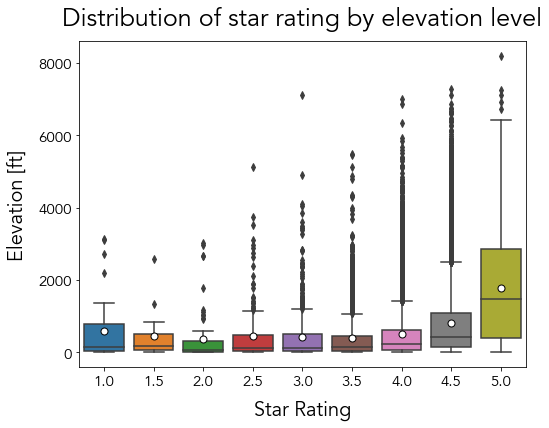

In [63]:
plt.figure(figsize=(8,6))
ax= sns.boxplot(x='stars',
                y='elevation', 
                data=df, 
                showmeans = True,
                meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"7"}
                   )
ax.set_xlabel('Star Rating', fontsize=20)
ax.set_ylabel('Elevation [ft]', fontsize=20)
ax.tick_params(labelsize=15)
ax.yaxis.labelpad = 10
ax.xaxis.labelpad = 10

plt.title('Distribution of star rating by elevation level', y=1.03, fontsize=25)
plt.show()

### Star rating vs distance

In [64]:
df['distance'].describe()

count    35265.000000
mean         4.837743
std          4.202348
min          0.000000
25%          1.900000
50%          3.500000
75%          6.400000
max         31.000000
Name: distance, dtype: float64

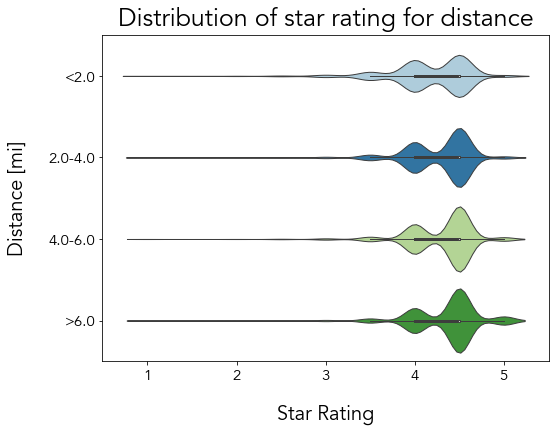

In [65]:
conditions = [
    (df['distance'] <= 2),
    (df['distance'] > 2) & (df['distance'] <= 4),
    (df['distance'] > 4) & (df['distance'] <= 6),
    (df['distance'] > 6)
    ]

# create a list of the values we want to assign for each condition
values = ['<2.0', '2.0-4.0', '4.0-6.0', '>6.0']

# create a new column and use np.select to assign values to it using our lists as arguments
df['tier'] = np.select(conditions, values)

# display updated DataFrame
df.head()

plt.figure(figsize=(8,6))
ax= sns.violinplot(y='tier',x='stars', data=df, order = values,
                   bw=0.3, scale='area', palette='Paired', 
                   orient='h', linewidth=1)

ax.set_xlabel('Star Rating', fontsize=20)
ax.set_ylabel('Distance [mi]', fontsize=20)
ax.tick_params(labelsize=15)


ax.yaxis.labelpad = 20
ax.xaxis.labelpad = 20

plt.title('Distribution of star rating for distance', y=1.01, fontsize=25)

plt.show()

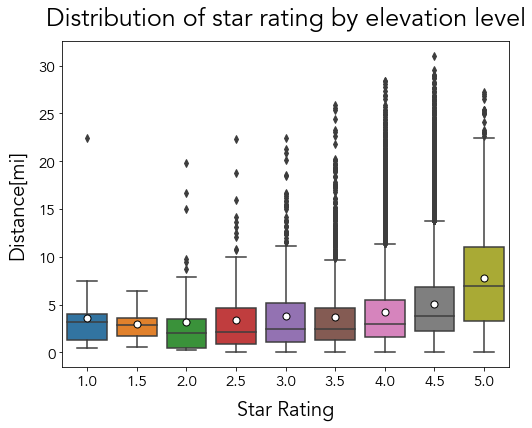

In [66]:
plt.figure(figsize=(8,6))
ax= sns.boxplot(x='stars',
                y='distance', 
                data=df, 
                showmeans = True,
                meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"7"}
                   )
ax.set_xlabel('Star Rating', fontsize=20)
ax.set_ylabel('Distance[mi]', fontsize=20)
ax.tick_params(labelsize=15)
ax.yaxis.labelpad = 10
ax.xaxis.labelpad = 10

plt.title('Distribution of star rating by elevation level', y=1.03, fontsize=25)
plt.show()

### Star rating vs duration

In [67]:
df['duration'].describe()

count    35265.000000
mean       143.353155
std        128.718800
min          1.000000
25%         52.000000
50%        100.000000
75%        192.000000
max        719.000000
Name: duration, dtype: float64

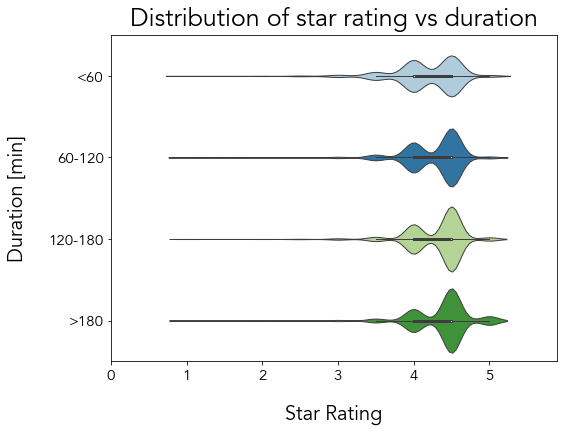

In [68]:
# Create conditions
conditions = [
    (df['duration'] <= 60),
    (df['duration'] > 60) & (df['duration'] <= 120),
    (df['duration'] > 120) & (df['duration'] <= 180),
    (df['duration'] > 180)
    ]

# create a list of the values we want to assign for each condition
values = ['<60', '60-120', '120-180', '>180']

# create a new column and use np.select to assign values to it using our lists as arguments
df['tier'] = np.select(conditions, values)

# display updated DataFrame
df.head()


plt.figure(figsize=(8,6))
ax= sns.violinplot(y='tier',x='stars', data=df, order=values,
                   bw=0.3, scale='area', palette='Paired', 
                   orient='h', linewidth=1)

#ax.set_title('Distribution of star rating for difficulty levels\n for trails with 3 or higher rating', fontsize=25)
ax.set_xlabel('Star Rating', fontsize=20)
ax.set_ylabel('Duration [min]', fontsize=20)
ax.tick_params(labelsize=15)
ax.set_xlim(0,5.9)

ax.yaxis.labelpad = 20
ax.xaxis.labelpad = 20

plt.title('Distribution of star rating vs duration', y=1.01, fontsize=25)

plt.show()

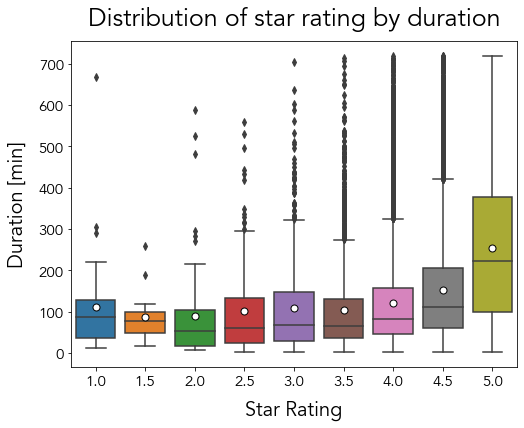

In [69]:
plt.figure(figsize=(8,6))
ax= sns.boxplot(x='stars',
                y='duration',
                data=df, 
                showmeans = True,
                meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"7"}
                   )
ax.set_xlabel('Star Rating', fontsize=20)
ax.set_ylabel('Duration [min]', fontsize=20)
ax.tick_params(labelsize=15)
ax.yaxis.labelpad = 10
ax.xaxis.labelpad = 10

plt.title('Distribution of star rating by duration', y=1.03, fontsize=25)
plt.show()

### Star rating vs long description (i.e. has long description or not)

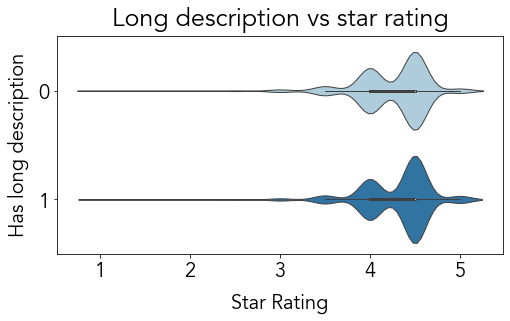

In [70]:
plt.figure(figsize=(8,4))
ax= sns.violinplot(x='stars',y='long', split=True, data=df, bw=0.3, scale='area', palette='Paired', orient='h', linewidth=1)
ax.set_ylabel('Has long description', fontsize=20)
ax.set_xlabel('Star Rating', fontsize=20)
ax.tick_params(labelsize=20)
ax.yaxis.labelpad = 10
ax.xaxis.labelpad = 10
plt.title('Long description vs star rating', y=1.02, fontsize=25)
plt.show()

### Star rating vs Total number of reviews 

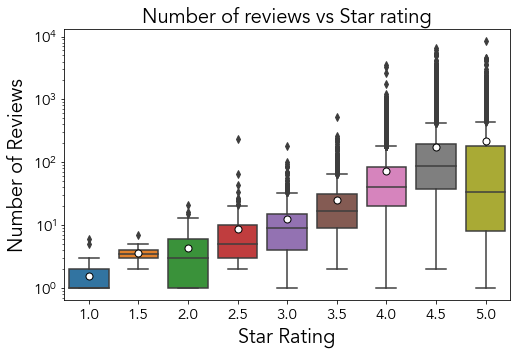

In [71]:
plt.figure(figsize=(8,5))

ax=sns.boxplot(y="review_count", 
               x="stars", 
               data=df, 
               showmeans=True, 
               meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"7"})
ax.set_yscale('log')
ax.set_title('Number of reviews vs Star rating', fontsize=20)
ax.set_ylabel('Number of Reviews', fontsize=20)
ax.set_xlabel('Star Rating', fontsize=20)
ax.tick_params(labelsize=15)

### Short description word count distribution by star rating

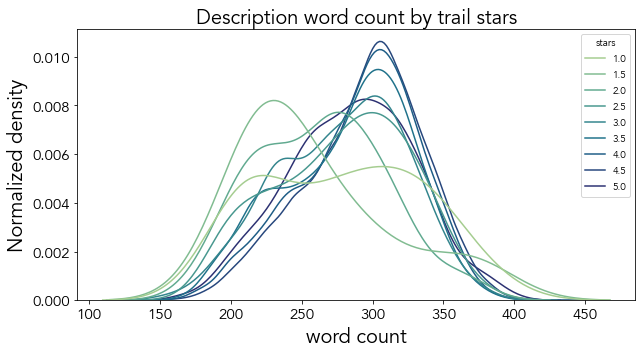

In [72]:
plt.figure(figsize=(10,5))

ax=sns.kdeplot(
   data=df, x="short", hue="stars", common_norm=False, palette="crest")

ax.set_title('Description word count by trail stars', fontsize=20)
ax.set_xlabel('word count', fontsize=20)
ax.set_ylabel('Normalized density', fontsize=20)
ax.tick_params(labelsize=15)

### Star rating vs number of tags

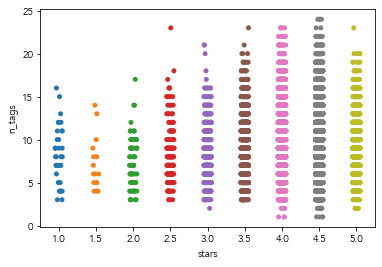

In [73]:
ax = sns.stripplot(data=df, y='n_tags', x='stars')

### Star rating vs number of photos

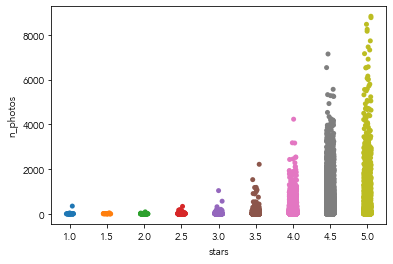

In [74]:
ax = sns.stripplot(data=df, y='n_photos', x='stars')

### Star rating vs number reviews 

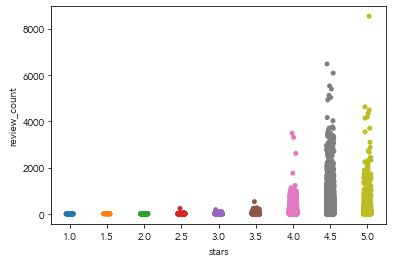

In [75]:
ax = sns.stripplot(data=df, y='review_count', x='stars')

### Star rating vs number of completions

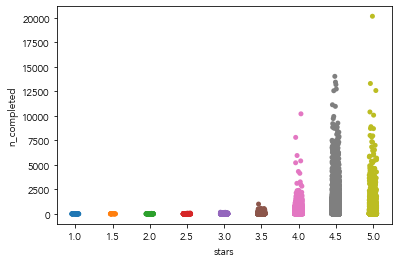

In [76]:
ax = sns.stripplot(data=df, y='n_completed', x='stars')